# Training a dynamic vision model for tracking cars

In [1]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.animation
from IPython.display import HTML

import numpy as np
from glob import glob
import csv
import torch
import pandas as pd
import time
from dataclasses import dataclass
import typing as ty

from tonic import Dataset, transforms
import tonic
import torch.nn.functional as F


import os, sys
import zipfile
import h5py
from torch.utils.data import DataLoader

# import slayer from lava-dl
import lava.lib.dl.slayer as slayer

# Create dataset using tonic

Tonic provides publicly available event-based vision and audio datasets and event transformations while being fully compatible with PyTorch Vision / Audio.

We make use of tonic to load our dataset and transform them to frames.

In [2]:
class TrafficSeqDataset(Dataset):
    sensor_size = (120, 90, 2,)  # the sensor size of the event camera or the number of channels of the silicon cochlear that was used
    ordering = (
        "xypt"  # the order in which your event channels are provided in your recordings
    )
    
    def __init__(
        self,
        transform=None,
        target_transform=None,
        train=True,
    ):
        super().__init__(
            save_to='./', transform=transform, target_transform=target_transform
        )
        self.filenames = glob("street_tracking/Traffic Sequences/Scene_B/**/*_events.csv")
        self.target_filenames = [f.replace("Traffic Sequences",
                                           "gt").replace("_events.csv",
                                                         "-custom24.txt") for f in self.filenames]
        
        # determine max_len
        self.max_len = 0
        for target_file in self.target_filenames:
            with open(target_file, "r") as f:
                num_lines = len(f.readlines())
                self.max_len = self.max_len if self.max_len > num_lines else num_lines
             
        if train:
            self.filenames = self.filenames[:int(len(self.filenames) * 0.9)]
            self.target_filenames = self.target_filenames[:int(len(self.target_filenames) * 0.9)]
        else:
            self.filenames = self.filenames[int(len(self.filenames) * 0.9):]
            self.target_filenames = self.target_filenames[int(len(self.target_filenames) * 0.9):]
        
    def __getitem__(self, index):
        
        data_filename = self.filenames[index]
        target_filename = self.target_filenames[index]
        
        events_ar = pd.read_csv(data_filename).to_numpy()

        events = np.zeros(len(events_ar), dtype=np.dtype([("y", int), ("x", int), ("p", int), ("t", int)]))
        events['t'] = np.array(events_ar[:, 0], dtype=int)
        events['x'] = np.array(events_ar[:, 1], dtype=int)
        events['y'] = np.array(events_ar[:, 2], dtype=int)
        events['p'] = np.array(events_ar[:, 3], dtype=int)

        targets = []
        with open(target_filename, "r") as f:
            lines = f.readlines()
            for line in lines:
                line = line.strip().split(', ')

                t = int(line[1])
                n_obj = len(line[2:]) // 5
                obj_id = int(line[2]) if n_obj > 0 else 0
                left = float(line[3]) if n_obj > 0 else 0
                top = float(line[4]) if n_obj > 0 else 0
                width = float(line[5]) if n_obj > 0 else 0
                height = float(line[6]) if n_obj > 0 else 0
                
                # TODO make the division by two with transformation
                targets.append([int(left + width / 2) // 2, 
                                int(top + height / 2) // 2])
            

        if self.transform is not None:
            events = self.transform(events)
            
        if self.target_transform is not None:
            targets = self.target_transform(np.array(targets))
        
        to_frame_trans = transforms.ToFrame(sensor_size=(120, 90, 2,),
                                            n_time_bins=len(targets))
        
        events = to_frame_trans(events)
        
        events = np.pad(events, [[0, self.max_len - events.shape[0]], [0, 0], [0, 0], [0, 0]], 'constant', constant_values=0)
        targets = np.pad(targets, [[0, self.max_len - targets.shape[0]], [0, 0]], 'constant', constant_values=0)

        return np.moveaxis(events, 0, -1), np.moveaxis(targets, 0, -1) 

    def __len__(self):
        return len(self.filenames)

# Load Data

In [3]:
batch_size = 4
train_set = TrafficSeqDataset(transform=transforms.Downsample(spatial_factor=0.5),
                              target_transform=transforms.NumpyAsType(int),
                              train=True)

test_set = TrafficSeqDataset(transform=transforms.Downsample(spatial_factor=0.5),
                             target_transform=transforms.NumpyAsType(int),
                             train=False)

train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_set, batch_size=batch_size, shuffle=True)

train_iter = iter(train_loader)
test_iter = iter(test_loader)

# Visualize the data

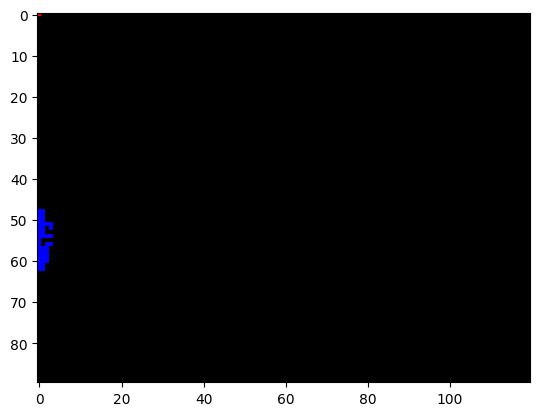

In [4]:
input, label = next(train_iter)

img = np.zeros((90, 120, 3), dtype=float)
img[:, :, 2] = input[0, 0, :, :, 0].numpy().clip(0, 1)
img[label[0, 0, 0], label[0, 1, 0], 0] = 1

fig, ax = plt.subplots()
im = plt.imshow(img);

def animate(t):
    img = np.zeros((90, 120, 3), dtype=float)
    img[:, :, 2] = input[0, 0, :, :, t].numpy().clip(0, 1)
    img[label[0, 1, t], label[0, 0, t], 0] = 1
        
    im.set_data(img)


ani = matplotlib.animation.FuncAnimation(fig, animate, frames=np.arange(0, label.shape[2], 1), interval=100)

HTML(ani.to_jshtml())

## Lava-DL

In [5]:
def event_rate_loss(x, max_rate=0.01):
    mean_event_rate = torch.mean(torch.abs(x))
    return F.mse_loss(F.relu(mean_event_rate - max_rate), torch.zeros_like(mean_event_rate))

# Create model

In [6]:
class Network(torch.nn.Module):
    def __init__(self):
        super().__init__()

        sdnn_params = { # sigma-delta neuron parameters
                'threshold'     : 0.1,    # delta unit threshold
                'tau_grad'      : 0.5,    # delta unit surrogate gradient relaxation parameter
                'scale_grad'    : 1,      # delta unit surrogate gradient scale parameter
                'requires_grad' : True,   # trainable threshold
                'shared_param'  : True,   # layer wise threshold
                'activation'    : F.relu, # activation function
            }
        sdnn_cnn_params = { # conv layer has additional mean only batch norm
                **sdnn_params,                                 # copy all sdnn_params
                'norm' : slayer.neuron.norm.MeanOnlyBatchNorm, # mean only quantized batch normalizaton
            }
        sdnn_dense_params = { # dense layers have additional dropout units enabled
                **sdnn_cnn_params,                        # copy all sdnn_cnn_params
                'dropout' : slayer.neuron.Dropout(p=0.2), # neuron dropout
            }
        
        weight_scale = 3
        self.blocks = torch.nn.ModuleList([# sequential network blocks 
                # delta encoding of the input
                slayer.block.sigma_delta.Input(sdnn_params), 
                # convolution layers
                slayer.block.sigma_delta.Conv(sdnn_cnn_params,  2, 24, 3, padding=0, stride=2, weight_scale=weight_scale, weight_norm=True),
                slayer.block.sigma_delta.Conv(sdnn_cnn_params, 24, 36, 3, padding=0, stride=2, weight_scale=weight_scale, weight_norm=True),
                slayer.block.sigma_delta.Conv(sdnn_cnn_params, 36, 64, 3, padding=0, stride=2, weight_scale=weight_scale, weight_norm=True),
                slayer.block.sigma_delta.Conv(sdnn_cnn_params, 64, 128, 3, padding=0, stride=1, weight_scale=weight_scale, weight_norm=True),
                # flatten layer
                slayer.block.sigma_delta.Flatten(),
                # dense layers
                slayer.block.sigma_delta.Dense(sdnn_dense_params, 128*96, 100, weight_scale=weight_scale, weight_norm=True),
                slayer.block.sigma_delta.Dense(sdnn_dense_params,   100,  50, weight_scale=weight_scale, weight_norm=True),
                slayer.block.sigma_delta.Dense(sdnn_dense_params,    50,  10, weight_scale=weight_scale, weight_norm=True),
                # linear readout with sigma decoding of output
                slayer.block.sigma_delta.Output(sdnn_dense_params,   10,   2, weight_scale=weight_scale, weight_norm=True)
            ])
    
    def forward(self, x):
        count = []
        event_cost = 0

        for block in self.blocks: 
            # forward computation is as simple as calling the blocks in a loop
            x = block(x)
            if hasattr(block, 'neuron'):
                event_cost += event_rate_loss(x)
                count.append(torch.sum(((x[..., 1:]) > 0).to(x.dtype)).item())

        return x, event_cost, torch.FloatTensor(count).reshape((1, -1)).to(x.device)

    def grad_flow(self, path):
        # helps monitor the gradient flow
        grad = [b.synapse.grad_norm for b in self.blocks if hasattr(b, 'synapse')]

        plt.figure()
        plt.semilogy(grad)
        plt.savefig(path + 'gradFlow.png')
        plt.close()

        return grad
    
    def export_hdf5(self, filename):
        # network export to hdf5 format
        h = h5py.File(filename, 'w')
        layer = h.create_group('layer')
        for i, b in enumerate(self.blocks):
            b.export_hdf5(layer.create_group(f'{i}'))

# Define loss, optimizer and assistant

In [7]:
trained_folder = 'Trained'
os.makedirs(trained_folder, exist_ok=True)

# device = torch.device('cpu')
device = torch.device('cuda') 

net = Network().to(device)


In [9]:

lr          = 0.0001 # leaerning rate
lam         = 0.01  # lagrangian for event rate loss
epochs      = 1000  # training epochs
# steps       = [60, 120, 160] # learning rate reduction milestones

def my_loss(o, t):
    return F.mse_loss(o.flatten(), t.flatten())

stats = slayer.utils.LearningStats()

optimizer = torch.optim.RAdam(net.parameters(), lr=lr, weight_decay=1e-5)

assistant = slayer.utils.Assistant(
        net=net,
        error=my_loss,
        optimizer=optimizer,
        stats=stats,
        count_log=True,
        lam=lam
    )




# Main training loop

In [10]:


for epoch in range(epochs):
    for i, (input, label) in enumerate(train_loader): # training loop
        
        output, num_spikes = assistant.train(input.float(), label.float())
        

    print(f'\r[Epoch {epoch:2d}/{epochs}] {stats}', end='')
        
    for i, (input, label) in enumerate(test_loader): # training loop
        output, num_spikes = assistant.test(input, label)
    print(f'\r[Epoch {epoch:2d}/{epochs}] {stats}', end='')
    
    if stats.testing.best_loss:
        torch.save(net.state_dict(), trained_folder + '/network.pt')
    stats.update()
    stats.save(trained_folder + '/')
    net.grad_flow(trained_folder + '/')

[Epoch 999/1000] Train loss =   145.26574 (min =    58.22161)     accuracy = 0.00000 (max = 0.00000)  | Test  loss =    27.25981 (min =    18.72032)     accuracy = 0.00000 (max = 0.00000) 

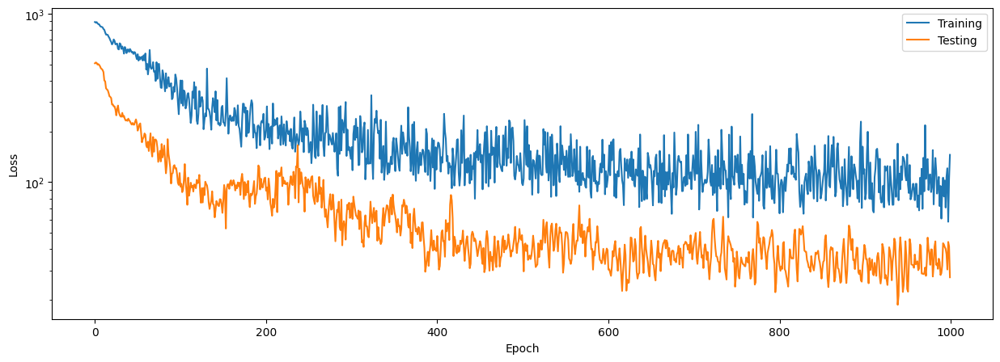

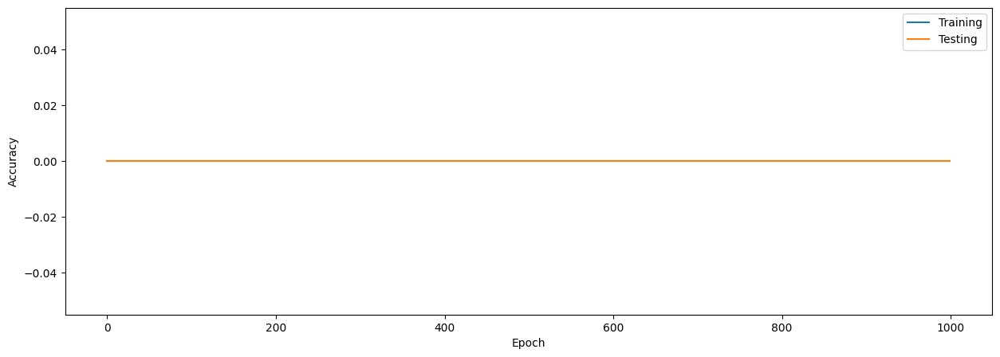

In [11]:
stats.plot(figsize=(15, 5))


# Visualize the prediction

In [15]:

# to load pre-trained network, uncomment the following linen
# fn = '/network_1000it.pt'
# net.load_state_dict(torch.load(trained_folder + fn))


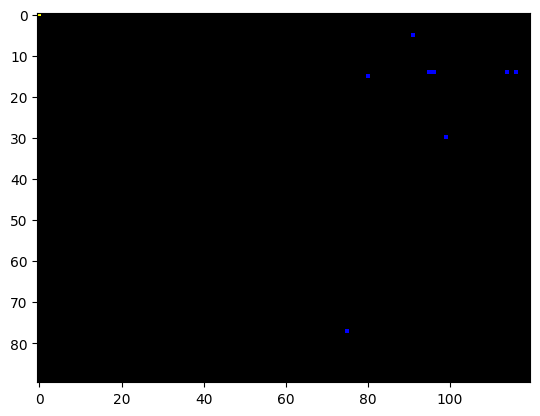

In [14]:
test_loader = DataLoader(test_set, batch_size=1)

for i, (input, label) in enumerate(test_loader):
    output, num_spikes = assistant.test(input, label)
    
    if i == 1:
        output = output.cpu().int().numpy()

        # print(label.shape)
        img = np.zeros((90, 120, 3), dtype=float)
        img[:, :, 2] = input[0, 0, :, :, 0].numpy().clip(0, 1)
        img[label[0, 1, 0], label[0, 0, 0], 0] = 1
        img[output[0, 1, 0], output[0, 0, 0], 1] = 1

        fig, ax = plt.subplots()
        im = plt.imshow(img);



        def animate(t):

            img = np.zeros((90, 120, 3), dtype=float)
            img[:, :, 2] = input[0, 0, :, :, t].numpy().clip(0, 1)
            img[label[0, 1, t], label[0, 0, t], 0] = 1
            img[output[0, 1, t], output[0, 0, t], 1] = 1

            im.set_data(img)

        ani = matplotlib.animation.FuncAnimation(fig, animate, frames=np.arange(0, label.shape[2], 1), interval=100)

        break
HTML(ani.to_jshtml())
 
    


In [ ]:
@dataclass
class BBox():
    object_id: int
    left: float
    top: float
    width: float
    height: float
    
    def get_center(self):
        return (self.left + self.width / 2, self.top + self.height / 2)

@dataclass
class Car:
    time: ty.List[int]
    bboxes: ty.List[ty.List[BBox]]
    

In [ ]:
data_files = glob("street_tracking/Traffic Sequences/Scene_B/**/*_events.csv")
gt_files = glob("street_tracking/gt/Scene_B/**/*-custom24.txt")
files = list(zip(data_files, gt_files))

In [ ]:
data_file, gt_file = files[0]

event_data = pd.read_csv(data_file).values
with open(gt_file, "r") as f:
    gt = Car(time=[], bboxes=[])
    
    t0 = None
    lines = f.readlines()
    for line in lines:
        line = line.strip().split(', ')
        if t0 is None:
            t0 = int(line[1])

        t = (int(line[1]) - t0) / 1000
        n_obj = len(line[2:]) // 5
        gt.time.append(t)
        gt.bboxes.append([])
        for o_id in range(n_obj):
            bbox = line[2:][o_id*5:(o_id+1)*5]
            gt.bboxes[-1].append(BBox(object_id=int(bbox[0]),
                                      left=float(bbox[1]),
                                      top=float(bbox[2]),
                                      width=float(bbox[3]),
                                      height=float(bbox[4])))

In [ ]:
print(gt)

In [ ]:
event_data[:, 0] -= event_data[0, 0] 

In [ ]:
event_data[:, 0] = event_data[:, 0] / 1000

In [ ]:
pos_evts = event_data[event_data[:, 3] == 1]
neg_evts = event_data[event_data[:, 3] == 0]

In [ ]:
neg_evts

In [ ]:
print(gt)

In [ ]:

interval = 20000

t = np.arange(interval, interval * 50, interval)
data = np.random.rand(180, 240, 3)
fig, ax = plt.subplots()
im = plt.imshow(data, interpolation='None');

gt_frame_id = 0

def animate(t):
    global gt_frame_id
    pos_frame = pos_evts[(pos_evts[:, 0] < t) & (pos_evts[:, 0] >= (t - interval))]
    pos_x = pos_frame[:, 1]
    pos_y = pos_frame[:, 2]
    
    neg_frame = neg_evts[(neg_evts[:, 0] < t) & (neg_evts[:, 0] >= (t - interval))]
    neg_x = neg_frame[:, 1]
    neg_y = neg_frame[:, 2]

    data = np.zeros((240, 180, 3))
    data[pos_x, pos_y, 1] += 1
    data[neg_x, neg_y, 1] += 1
    
    current_gt_frame_id = np.where((gt.time < t) & (gt.time >= (t-interval)))[0]
    if len(current_gt_frame_id) > 0:
        gt_frame_id = current_gt_frame_id[-1]
    current_bboxes = gt.bboxes[gt_frame_id]
    for bbox in current_bboxes:
        center = bbox.get_center()
        data[int(center[0]), int(center[1]), 0] = 1
        
    
    
    
    im.set_data(data)


ani = matplotlib.animation.FuncAnimation(fig, animate, frames=t)#, interval=200)

HTML(ani.to_jshtml())

import h5py
def get_dataset():
    f = h5py.File('traffic_monitoring.hdf5', 'r')
    return f
ds = get_dataset()

data_group = ds["CD"]

idxs = data_group['indexes']
evts = data_group['events']

pos_idxs = evts['p'] == 1
neg_idxs = evts['p'] == 0

pos_evts = evts[pos_idxs]
neg_evts = evts[neg_idxs]


first_frame_idx = pos_evts['t'] < 1000000
first_frame = pos_evts[first_frame_idx]

x = first_frame['x']
y = first_frame['y']

data, _, _ = np.histogram2d(x, y, bins=(640, 480), range=[(0, 640), (0, 480)])


def determine_num_clusters(data):
    if len(data) == 1:
        data = data.reshape(1, -1)
    elif len(data) < 1:
        return 0, np.array([])
    
    cluster_alg = DBSCAN(eps=20, min_samples=100).fit(data)
    labels = cluster_alg.labels_
    return np.max(labels) + 1, labels

import matplotlib.pyplot as plt
import matplotlib.animation
import numpy as np

interval = 200000

t = np.arange(interval, interval * 200, interval)

fig, ax = plt.subplots()
im = plt.imshow(data.T, norm='symlog', interpolation='None')

def animate(t):
    frame = pos_evts[(pos_evts['t'] < t) & (pos_evts['t'] > (t - interval))]
    x = frame['x']
    y = frame['y']
    
    
    samples = np.array(list(zip(x, y)))
    samples = np.unique(samples, axis=0)
    
    num_clusters, labels = determine_num_clusters(samples)
    print(t, "True num clusters", num_clusters)
     
    data = np.zeros((640, 480))
    if num_clusters > 0:
        data[samples[:, 0], samples[:, 1]] = labels + 1
    
    im.set_data(data)
#     data, _, _ = np.histogram2d(x, y, bins=(640, 480), range=[(0, 640), (0, 480)])    
#     im.set_data(data)


ani = matplotlib.animation.FuncAnimation(fig, animate, frames=t, interval=200)

from IPython.display import HTML
HTML(ani.to_jshtml())

# Obtain data

# Data transformations 

# Data loader

# Model description

# Train, test, val functions

# Training loop

# Testing